# EDA (Exploratory Data Analysis)

- Exploratory Data Analysis (EDA) is an approach to analyze the data using visual techniques and statistical techniques. It is used to discover trends, patterns, or to check assumptions with the help of statistical summary and graphical representations.

**Steps involved in EDA**
1. Describing the data
2. Data cleaning
3. Imputation techniques
4. Data analysis and visualization
5. Transformations
6. Auto EDA

**Import data and data description**

In [1]:
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv(r"C:\Users\sunny\Desktop\DS Material\Data Set\data_clean.csv", index_col=0)
df.head()

,Ozone,Solar.R,Wind,Temp C,Month,Day,Year,Temp,Weather
1,41.0,190.0,7.4,67,5,1,2010,67,S
2,36.0,118.0,8.0,72,5,2,2010,72,C
3,12.0,149.0,12.6,74,5,3,2010,74,PS
4,18.0,313.0,11.5,62,5,4,2010,62,S
5,NaN,NaN,14.3,56,5,5,2010,56,S


In [3]:
df.describe()

,Ozone,Solar.R,Wind,Day,Year,Temp
count,120.000000,151.000000,158.000000,158.000000,158.0,158.000000
mean,41.583333,185.403974,9.957595,16.006329,2010.0,77.727848
std,32.620709,88.723103,3.511261,8.997166,0.0,9.377877
min,1.000000,7.000000,1.700000,1.000000,2010.0,56.000000
25%,18.000000,119.000000,7.400000,8.000000,2010.0,72.000000
50%,30.500000,197.000000,9.700000,16.000000,2010.0,78.500000
75%,61.500000,257.000000,11.875000,24.000000,2010.0,84.000000
max,168.000000,334.000000,20.700000,31.000000,2010.0,97.000000


In [4]:
df.describe(include=object)

,Temp C,Month,Weather
count,158,158,155
unique,41,6,3
top,81,9,S
freq,11,34,59


In [5]:
df.head()

,Ozone,Solar.R,Wind,Temp C,Month,Day,Year,Temp,Weather
1,41.0,190.0,7.4,67,5,1,2010,67,S
2,36.0,118.0,8.0,72,5,2,2010,72,C
3,12.0,149.0,12.6,74,5,3,2010,74,PS
4,18.0,313.0,11.5,62,5,4,2010,62,S
5,NaN,NaN,14.3,56,5,5,2010,56,S


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 158 entries, 1 to 158
Data columns (total 9 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Ozone    120 non-null    float64
 1   Solar.R  151 non-null    float64
 2   Wind     158 non-null    float64
 3   Temp C   158 non-null    object 
 4   Month    158 non-null    object 
 5   Day      158 non-null    int64  
 6   Year     158 non-null    int64  
 7   Temp     158 non-null    int64  
 8   Weather  155 non-null    object 
dtypes: float64(3), int64(3), object(3)
memory usage: 12.3+ KB


In [7]:
#Draw inferences from the info.

#There are null values present in Ozone, Solar and Weather columns.
#Temp C and Month columns have numerical data but info method is giving as object.

# **Data type conversion**

**There are 2 ways by which we can convert the data type of these 2 columns**
- By using replace method.
- By using pandas built in functions.

In [8]:
df['Temp C'].unique()

array(['67', '72', '74', '62', '56', '66', '65', '59', '61', '69', 'C',
       '68', '58', '64', '57', '73', '81', '79', '76', '78', '84', '85',
       '82', '87', '90', '93', '92', '80', '77', '75', '83', '88', '89',
       '91', '86', '97', '94', '96', '71', '63', '70'], dtype=object)

In [9]:
df['Temp C'].value_counts()

81    11
76    10
82     9
77     8
86     7
78     6
79     6
67     5
73     5
75     5
80     5
92     5
87     5
85     5
84     5
83     4
68     4
57     3
71     3
72     3
69     3
61     3
74     3
90     3
93     3
66     3
88     3
94     2
91     2
89     2
70     2
62     2
64     2
65     2
59     2
58     2
97     1
C      1
96     1
63     1
56     1
Name: Temp C, dtype: int64

In [10]:
df['Month'].unique()

array(['5', 'May', '6', '7', '8', '9'], dtype=object)

In [11]:
df['Month'].replace('May','5',inplace=True)

In [12]:
df['Month'].dtype

dtype('O')

In [13]:
df['Month'] = df['Month'].astype(int)

In [14]:
df['Month'].unique()

array([5, 6, 7, 8, 9])

In [15]:
df['Month'].dtype

dtype('int32')

In [16]:
df['Temp C'] = pd.to_numeric(df['Temp C'], errors='coerce') # Coerce(whereever the invalid entry is it will convert in to Nan ) 

In [17]:
df['Temp C'].dtype

dtype('float64')

In [18]:
df.head()

,Ozone,Solar.R,Wind,Temp C,Month,Day,Year,Temp,Weather
1,41.0,190.0,7.4,67.0,5,1,2010,67,S
2,36.0,118.0,8.0,72.0,5,2,2010,72,C
3,12.0,149.0,12.6,74.0,5,3,2010,74,PS
4,18.0,313.0,11.5,62.0,5,4,2010,62,S
5,NaN,NaN,14.3,56.0,5,5,2010,56,S


In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 158 entries, 1 to 158
Data columns (total 9 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Ozone    120 non-null    float64
 1   Solar.R  151 non-null    float64
 2   Wind     158 non-null    float64
 3   Temp C   157 non-null    float64
 4   Month    158 non-null    int32  
 5   Day      158 non-null    int64  
 6   Year     158 non-null    int64  
 7   Temp     158 non-null    int64  
 8   Weather  155 non-null    object 
dtypes: float64(4), int32(1), int64(3), object(1)
memory usage: 11.7+ KB


# Duplicates

In [20]:
df.duplicated()

1      False
2      False
3      False
4      False
5      False
       ...  
154    False
155    False
156    False
157     True
158    False
Length: 158, dtype: bool

In [21]:
#Print the duplicated values

In [22]:
df[df.duplicated()]

,Ozone,Solar.R,Wind,Temp C,Month,Day,Year,Temp,Weather
157,14.0,191.0,14.3,75.0,9,28,2010,75,S


In [23]:
#Get all the duplicate values.
#2 Approaches

In [24]:
df[(df['Ozone']==14.0) &(df['Wind']==14.3)]

,Ozone,Solar.R,Wind,Temp C,Month,Day,Year,Temp,Weather
151,14.0,191.0,14.3,75.0,9,28,2010,75,S
157,14.0,191.0,14.3,75.0,9,28,2010,75,S


In [25]:
df[df.duplicated(keep=False)]

,Ozone,Solar.R,Wind,Temp C,Month,Day,Year,Temp,Weather
151,14.0,191.0,14.3,75.0,9,28,2010,75,S
157,14.0,191.0,14.3,75.0,9,28,2010,75,S


In [26]:
#Drop duplicate values

In [27]:
df.drop_duplicates()

,Ozone,Solar.R,Wind,Temp C,Month,Day,Year,Temp,Weather
1,41.0,190.0,7.4,67.0,5,1,2010,67,S
2,36.0,118.0,8.0,72.0,5,2,2010,72,C
3,12.0,149.0,12.6,74.0,5,3,2010,74,PS
4,18.0,313.0,11.5,62.0,5,4,2010,62,S
5,NaN,NaN,14.3,56.0,5,5,2010,56,S
...,...,...,...,...,...,...,...,...,...
153,20.0,223.0,11.5,68.0,9,30,2010,68,S
154,41.0,190.0,7.4,67.0,5,1,2010,67,C
155,30.0,193.0,6.9,70.0,9,26,2010,70,PS
156,NaN,145.0,13.2,77.0,9,27,2010,77,S


In [28]:
df.duplicated().sum()

1

In [29]:
#Make the changes permanent

In [30]:
df.drop_duplicates(inplace=True)

In [31]:
df.duplicated().sum()

0

# Drop columns

- There is one column which only has single different value.
- We need to get rid of all the uneccesary columns or else it will be very complex data.

In [32]:
df.head()

,Ozone,Solar.R,Wind,Temp C,Month,Day,Year,Temp,Weather
1,41.0,190.0,7.4,67.0,5,1,2010,67,S
2,36.0,118.0,8.0,72.0,5,2,2010,72,C
3,12.0,149.0,12.6,74.0,5,3,2010,74,PS
4,18.0,313.0,11.5,62.0,5,4,2010,62,S
5,NaN,NaN,14.3,56.0,5,5,2010,56,S


In [33]:
df.drop(columns=['Temp C'])

,Ozone,Solar.R,Wind,Month,Day,Year,Temp,Weather
1,41.0,190.0,7.4,5,1,2010,67,S
2,36.0,118.0,8.0,5,2,2010,72,C
3,12.0,149.0,12.6,5,3,2010,74,PS
4,18.0,313.0,11.5,5,4,2010,62,S
5,NaN,NaN,14.3,5,5,2010,56,S
...,...,...,...,...,...,...,...,...
153,20.0,223.0,11.5,9,30,2010,68,S
154,41.0,190.0,7.4,5,1,2010,67,C
155,30.0,193.0,6.9,9,26,2010,70,PS
156,NaN,145.0,13.2,9,27,2010,77,S


In [34]:
df.head()

,Ozone,Solar.R,Wind,Temp C,Month,Day,Year,Temp,Weather
1,41.0,190.0,7.4,67.0,5,1,2010,67,S
2,36.0,118.0,8.0,72.0,5,2,2010,72,C
3,12.0,149.0,12.6,74.0,5,3,2010,74,PS
4,18.0,313.0,11.5,62.0,5,4,2010,62,S
5,NaN,NaN,14.3,56.0,5,5,2010,56,S


In [35]:
df.drop(columns=['Temp C'], inplace=True)

In [36]:
df.head()

,Ozone,Solar.R,Wind,Month,Day,Year,Temp,Weather
1,41.0,190.0,7.4,5,1,2010,67,S
2,36.0,118.0,8.0,5,2,2010,72,C
3,12.0,149.0,12.6,5,3,2010,74,PS
4,18.0,313.0,11.5,5,4,2010,62,S
5,NaN,NaN,14.3,5,5,2010,56,S


# Rename the columns

In [37]:
df.rename(columns={'Solar.R':'Solar', 'Temp':'Temperature'}, inplace=True)

In [38]:
df.head()

,Ozone,Solar,Wind,Month,Day,Year,Temperature,Weather
1,41.0,190.0,7.4,5,1,2010,67,S
2,36.0,118.0,8.0,5,2,2010,72,C
3,12.0,149.0,12.6,5,3,2010,74,PS
4,18.0,313.0,11.5,5,4,2010,62,S
5,NaN,NaN,14.3,5,5,2010,56,S


# Missing value imputation

- In dataset, missing data, or missing values, occur when no data value is stored for the variable in an observation.
- Missing data are a common occurrence and can have a significant effect on the conclusions that can be drawn from the data.
- If we don't impute or handle null values, we will not be able to create a machine learning model as python does not understand missing values.
- Handling missing values is a crucial step in EDA.
- Missing values can appear for several reasons like:
    - Incomplete data entry
    - Issues with machines
    - Improper handling of data
    - And many more.
         

In [39]:
#Checking null values

In [40]:
df.isna().sum()

Ozone          38
Solar           7
Wind            0
Month           0
Day             0
Year            0
Temperature     0
Weather         3
dtype: int64

In [41]:
for i in df.isna().sum():
               print(f'Missing value : {(i/len(df)*100)}%')

Missing value : 24.203821656050955%
Missing value : 4.45859872611465%
Missing value : 0.0%
Missing value : 0.0%
Missing value : 0.0%
Missing value : 0.0%
Missing value : 0.0%
Missing value : 1.910828025477707%


In [42]:

#Visualize the missing values

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [44]:
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 250

<AxesSubplot:>

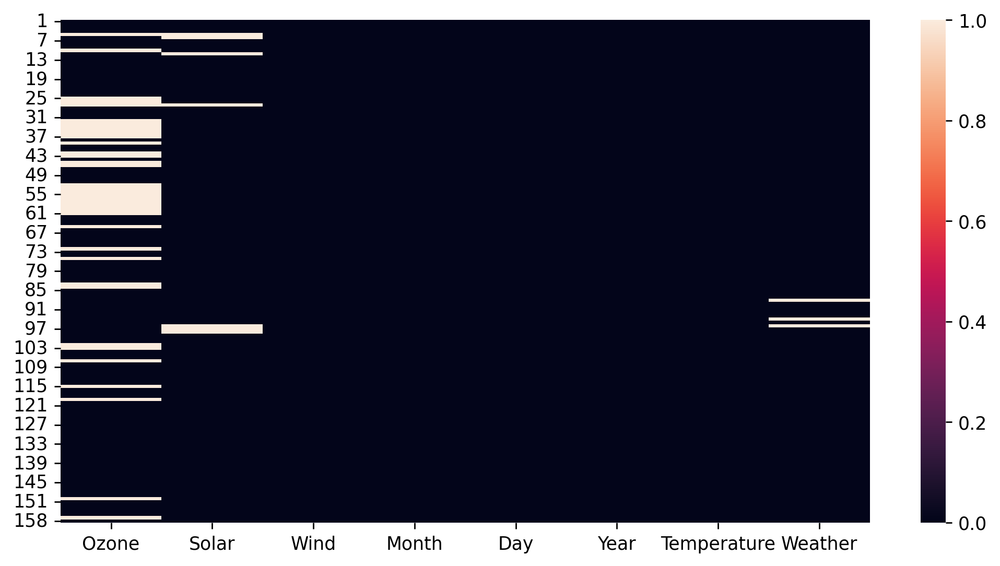

In [45]:
sns.heatmap(df.isna(), )#cmap=['#3434eb','#3ffc19'])

# Rules for missing value imputation:

1. If the null values are less than 3%, Use dropna()
2. If the null values are between 5 to 40%, use fillna()
3. If the null values are greater than 50%, drop the entire column.

In [46]:
df.head()

,Ozone,Solar,Wind,Month,Day,Year,Temperature,Weather
1,41.0,190.0,7.4,5,1,2010,67,S
2,36.0,118.0,8.0,5,2,2010,72,C
3,12.0,149.0,12.6,5,3,2010,74,PS
4,18.0,313.0,11.5,5,4,2010,62,S
5,NaN,NaN,14.3,5,5,2010,56,S


In [50]:
median_ozone =  df['Ozone'].median()
median_ozone

31.0

In [51]:
df['Ozone'].fillna(median_ozone, inplace=True)

In [52]:
df['Ozone'].isna().sum()

0

In [53]:
df['Solar'].fillna(df['Solar'].median(), inplace=True)

In [54]:
df[df['Weather'].isna()]

,Ozone,Solar,Wind,Month,Day,Year,Temperature,Weather
88,52.0,82.0,12.0,7,27,2010,86,NaN
94,9.0,24.0,13.8,8,2,2010,81,NaN
96,78.0,199.0,6.9,8,4,2010,86,NaN


In [55]:
df['Weather'].mode()

0    S
Name: Weather, dtype: object

In [56]:
df['Weather'].fillna(df['Weather'].mode()[0], inplace=True)  #[0] it is a index no, we need to put index no

In [57]:
df['Weather'].mode()

0    S
Name: Weather, dtype: object

In [58]:
df.isnull().sum()

Ozone          0
Solar          0
Wind           0
Month          0
Day            0
Year           0
Temperature    0
Weather        0
dtype: int64

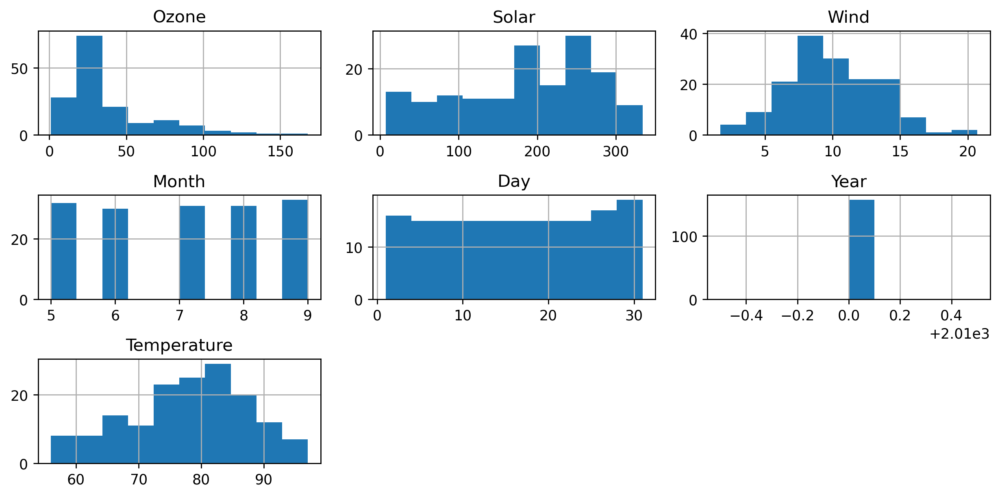

In [59]:
df.hist()
plt.tight_layout()

# Outlier detection

- There are multiple approaches to detect outliers in the dataset.
    - Histogram
    - Boxplot
    - Descriptive stats for df

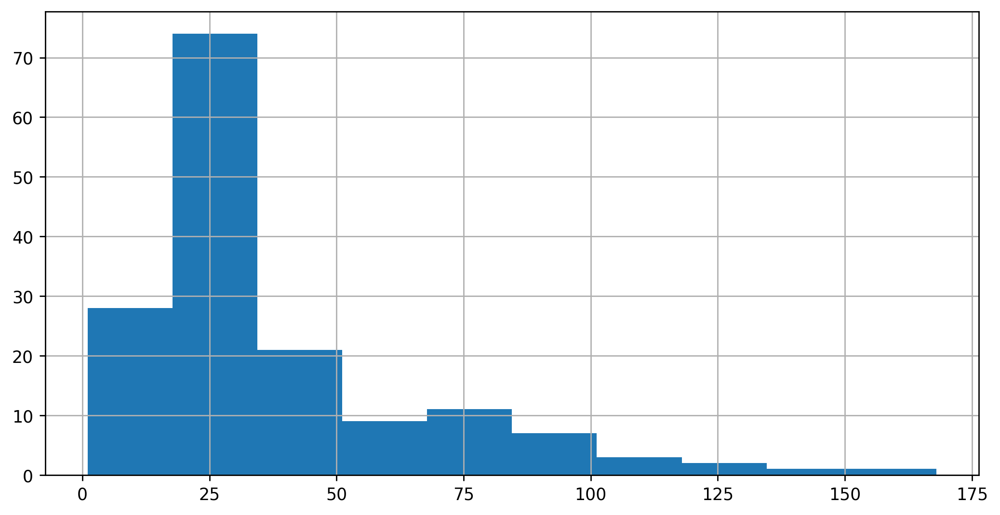

In [60]:
plt.hist(df['Ozone'])
plt.grid()

<AxesSubplot:xlabel='Ozone', ylabel='Density'>

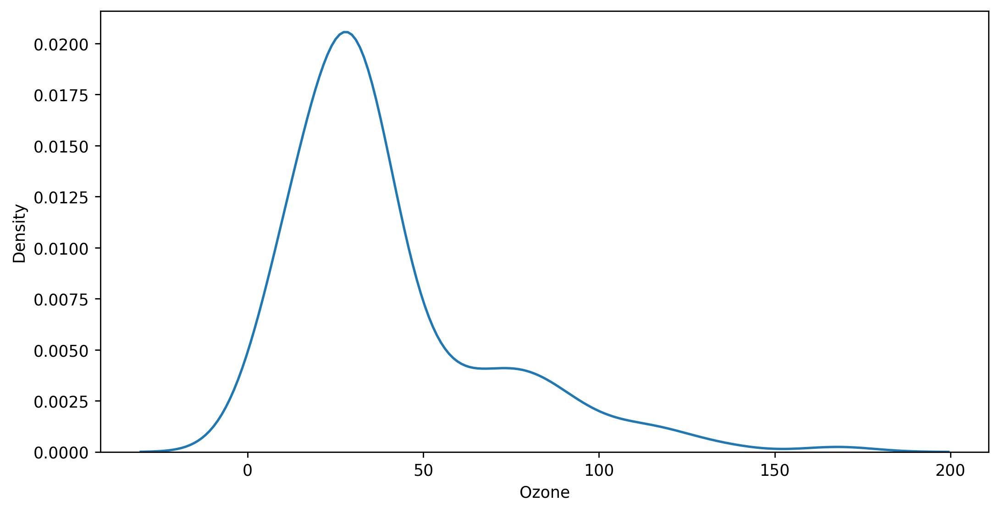

In [61]:
sns.kdeplot(df['Ozone'])

<AxesSubplot:xlabel='Ozone', ylabel='Density'>

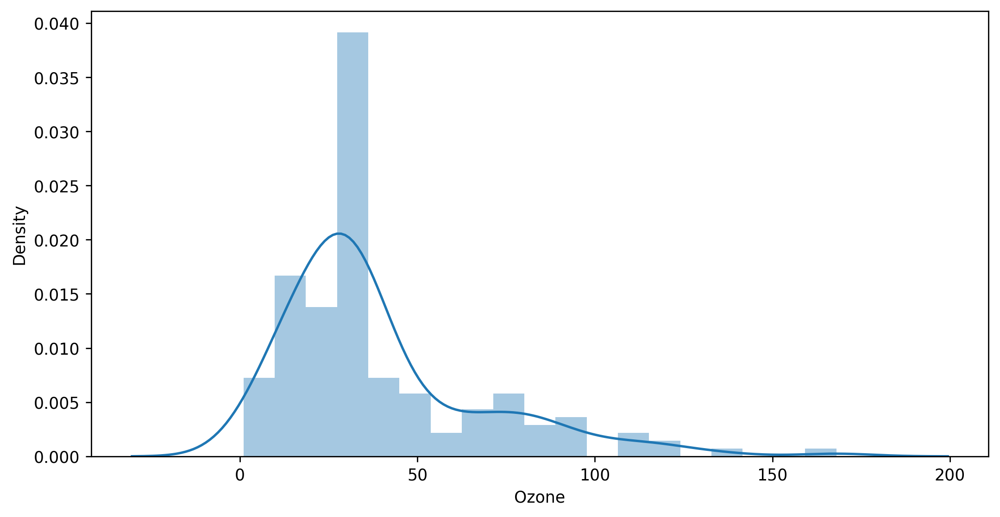

In [62]:
sns.distplot(df['Ozone'])

<AxesSubplot:>

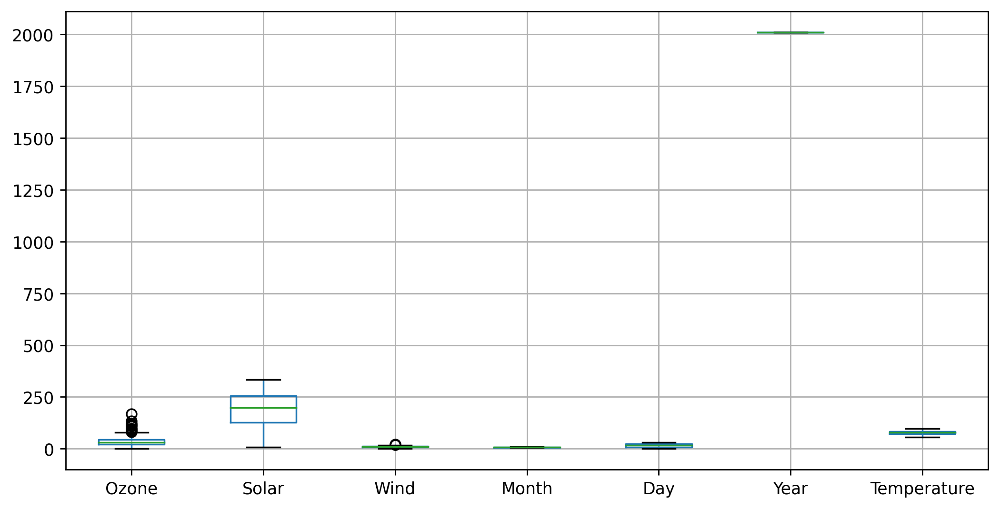

In [63]:
df.boxplot()

In [64]:
#Need to mention 2 things dataframe and & the column from which we want to compute upper value & lower extreme 
# quantile is a built in function to calculate 25 & 75 th percentile.

def outlier_detection(df,col):
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    IQR = q3-q1
    
    upper = q3+(1.5*IQR)
    lower = q1-(1.5*IQR)
    
    
    return lower, upper


In [65]:
outlier_detection(df, 'Ozone')

# It will give us lower extreme & upper exxtreme

(-15.0, 81.0)

In [66]:
# capping 
df[df['Ozone']>81.0]

,Ozone,Solar,Wind,Month,Day,Year,Temperature,Weather
30,115.0,223.0,5.7,5,30,2010,79,C
62,135.0,269.0,4.1,7,1,2010,84,S
69,97.0,267.0,6.3,7,8,2010,92,PS
70,97.0,272.0,5.7,7,9,2010,92,C
71,85.0,175.0,7.4,7,10,2010,89,PS
86,108.0,223.0,8.0,7,25,2010,85,PS
89,82.0,213.0,7.4,7,28,2010,88,S
99,122.0,255.0,4.0,8,7,2010,89,C
100,89.0,229.0,10.3,8,8,2010,90,PS
101,110.0,207.0,8.0,8,9,2010,90,C


In [67]:
df.loc[df['Ozone']>81.0, 'Ozone'] = 81.0

<AxesSubplot:xlabel='Ozone'>

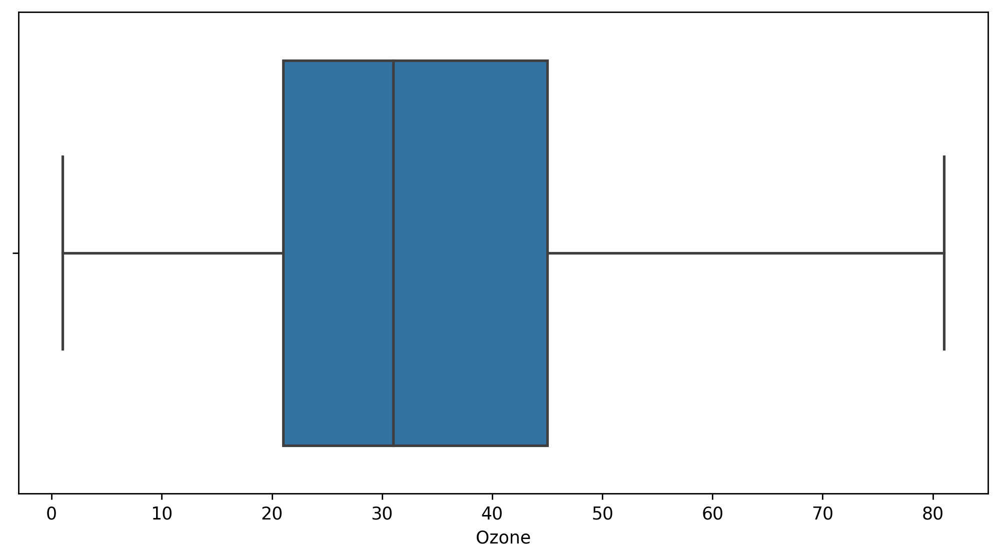

In [68]:
sns.boxplot(df['Ozone'])

- Now we r not having any outliers in Ozone

In [69]:
outlier_detection(df, 'Wind')

(1.2500000000000009, 17.65)

<AxesSubplot:xlabel='Wind'>

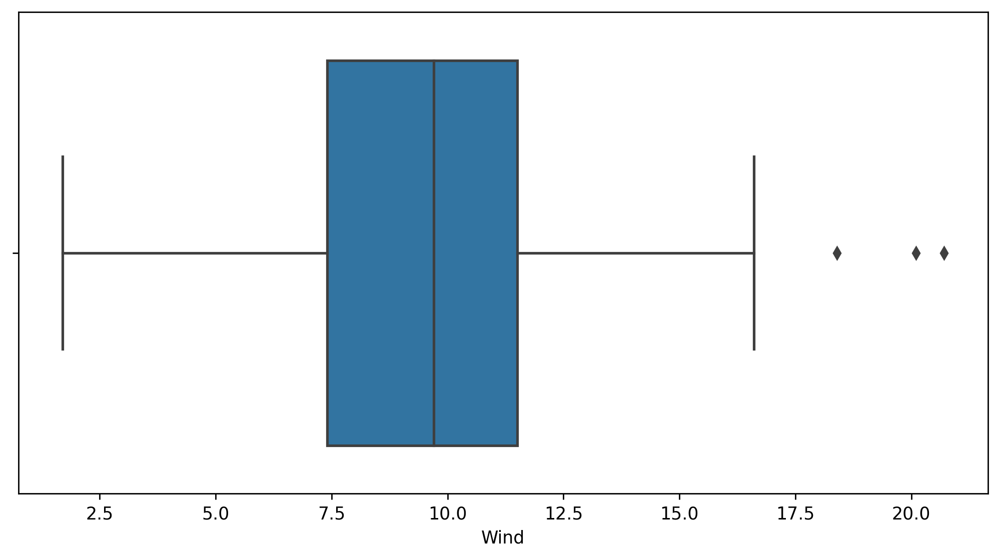

In [70]:
sns.boxplot(df['Wind'])

In [71]:
df.loc[df['Wind']>17.65, 'Wind'] = 17.65

# put wind so that for only wind column we convert all oulliers as a ipper extreme

<AxesSubplot:xlabel='Wind'>

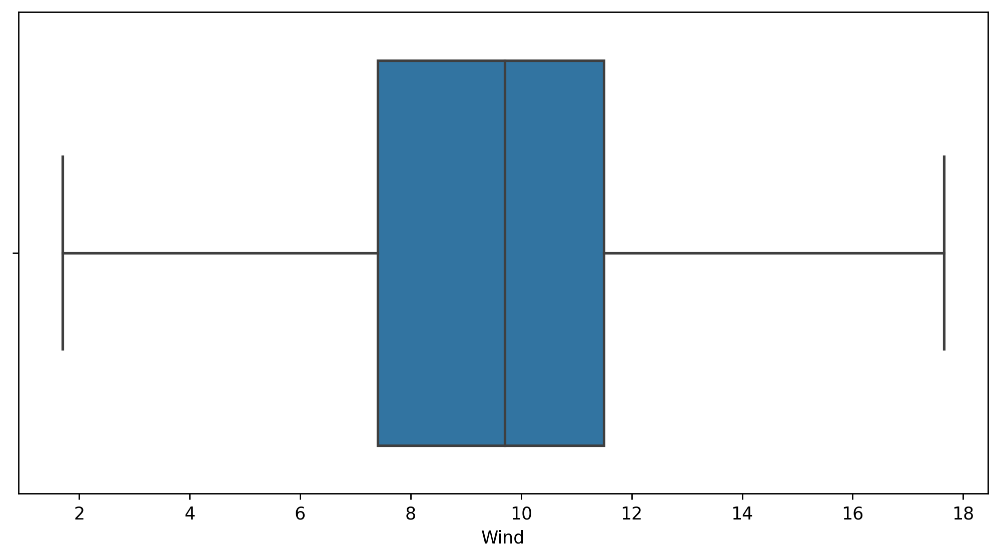

In [72]:
sns.boxplot(df['Wind'])

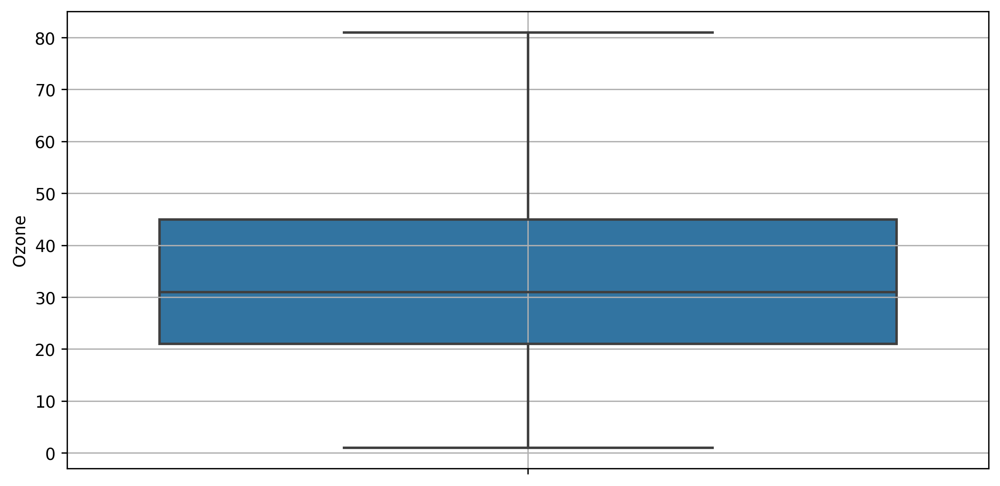

In [73]:
sns.boxplot(y = df['Ozone'])
plt.grid()

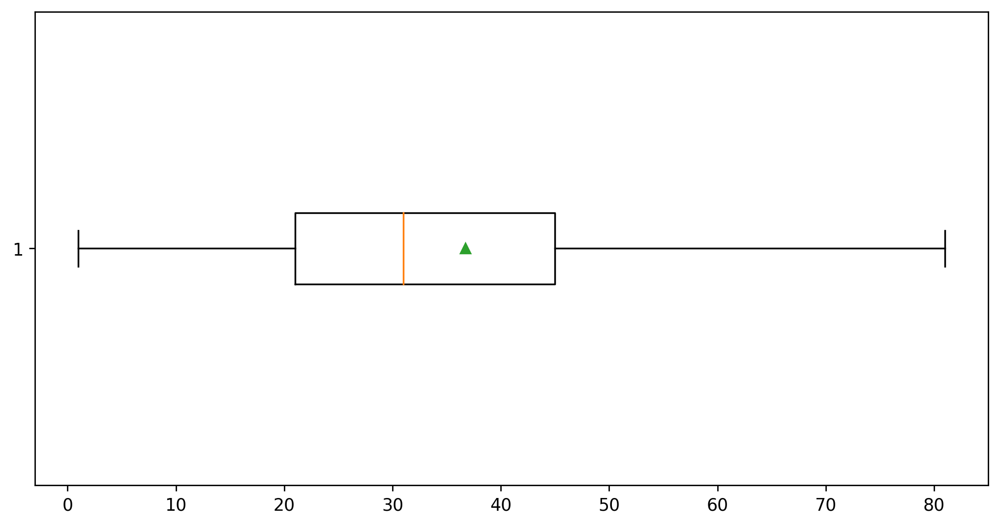

In [74]:
plt.boxplot(df['Ozone'], showmeans=True,vert=False)
plt.show()

# Scatter Plot and Correlation

In [75]:
df.head()

,Ozone,Solar,Wind,Month,Day,Year,Temperature,Weather
1,41.0,190.0,7.4,5,1,2010,67,S
2,36.0,118.0,8.0,5,2,2010,72,C
3,12.0,149.0,12.6,5,3,2010,74,PS
4,18.0,313.0,11.5,5,4,2010,62,S
5,31.0,199.0,14.3,5,5,2010,56,S


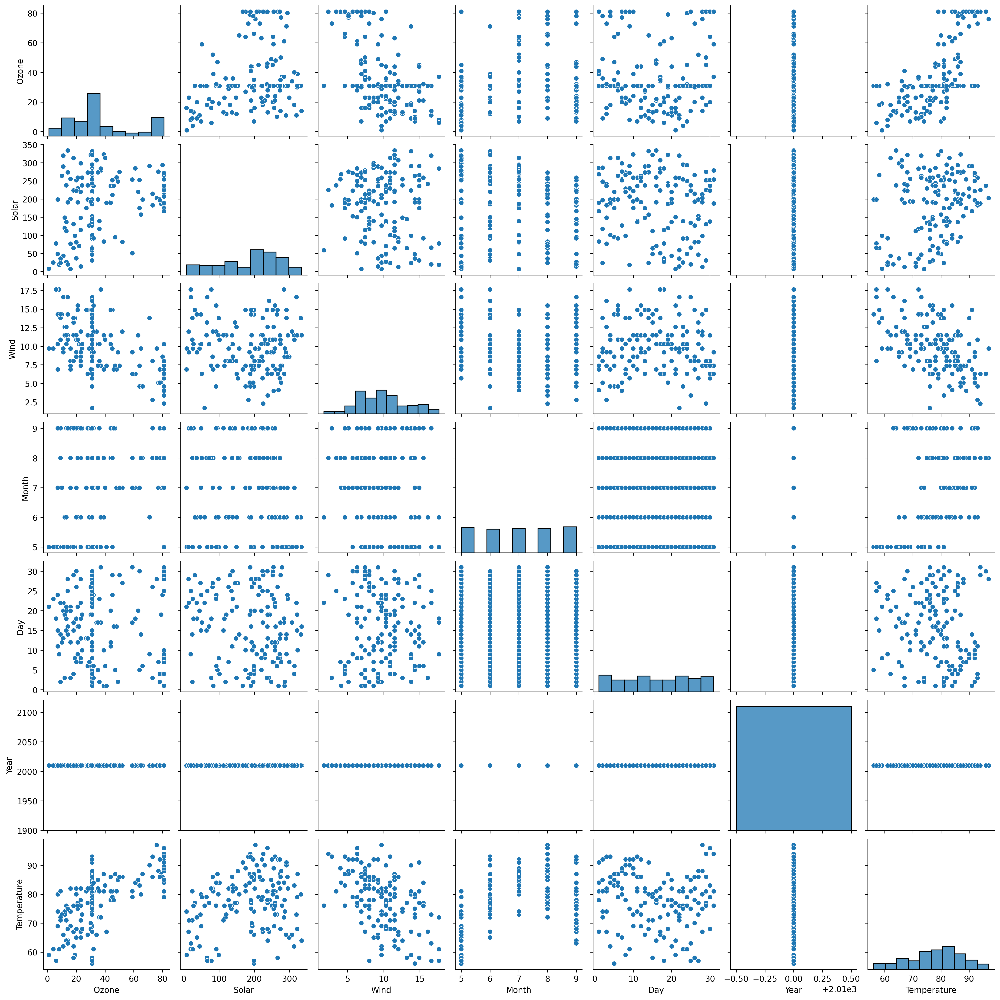

In [76]:
sns.pairplot(df)

In [77]:
df

,Ozone,Solar,Wind,Month,Day,Year,Temperature,Weather
1,41.0,190.0,7.4,5,1,2010,67,S
2,36.0,118.0,8.0,5,2,2010,72,C
3,12.0,149.0,12.6,5,3,2010,74,PS
4,18.0,313.0,11.5,5,4,2010,62,S
5,31.0,199.0,14.3,5,5,2010,56,S
...,...,...,...,...,...,...,...,...
153,20.0,223.0,11.5,9,30,2010,68,S
154,41.0,190.0,7.4,5,1,2010,67,C
155,30.0,193.0,6.9,9,26,2010,70,PS
156,31.0,145.0,13.2,9,27,2010,77,S


<AxesSubplot:xlabel='Wind', ylabel='Temperature'>

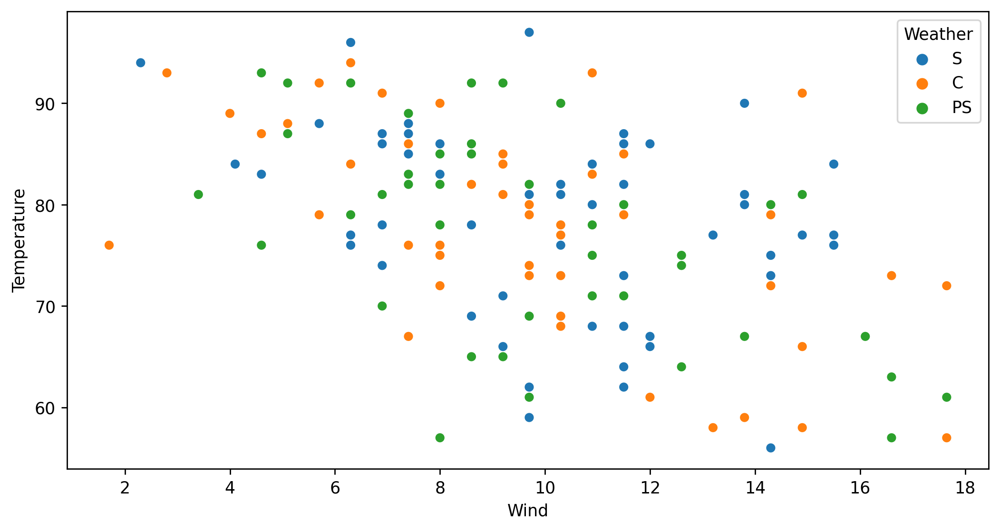

In [78]:
sns.scatterplot(df['Wind'], df['Temperature'], hue=df['Weather'])

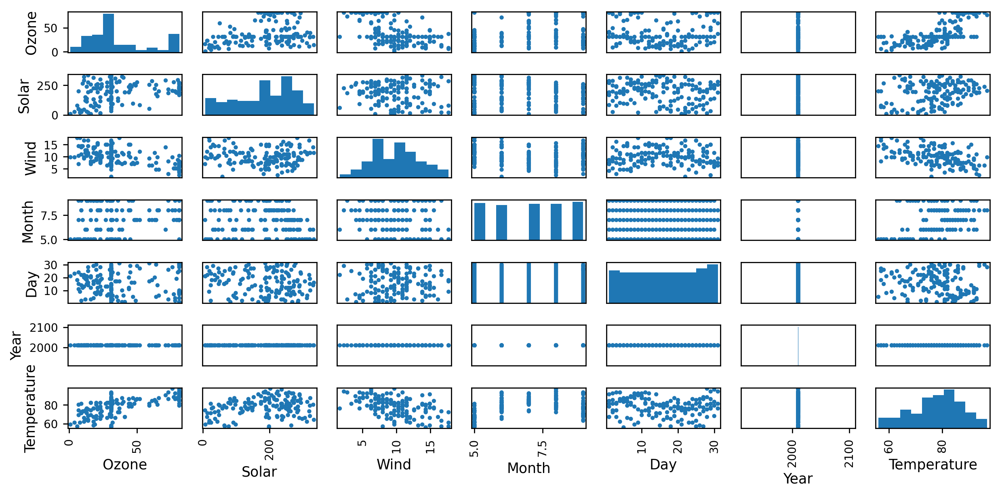

In [79]:
pd.plotting.scatter_matrix(df,alpha=1)
plt.tight_layout()

In [80]:
#Correlation coefficient

In [81]:
df.corr()

,Ozone,Solar,Wind,Month,Day,Year,Temperature
Ozone,1.000000,0.318600,-0.522513,0.183089,-0.042835,NaN,0.662773
Solar,0.318600,1.000000,-0.055345,-0.083788,-0.156243,NaN,0.256994
Wind,-0.522513,-0.055345,1.000000,-0.162988,0.033374,NaN,-0.439939
Month,0.183089,-0.083788,-0.162988,1.000000,0.041438,NaN,0.408060
Day,-0.042835,-0.156243,0.033374,0.041438,1.000000,NaN,-0.122787
Year,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Temperature,0.662773,0.256994,-0.439939,0.408060,-0.122787,NaN,1.000000


<AxesSubplot:>

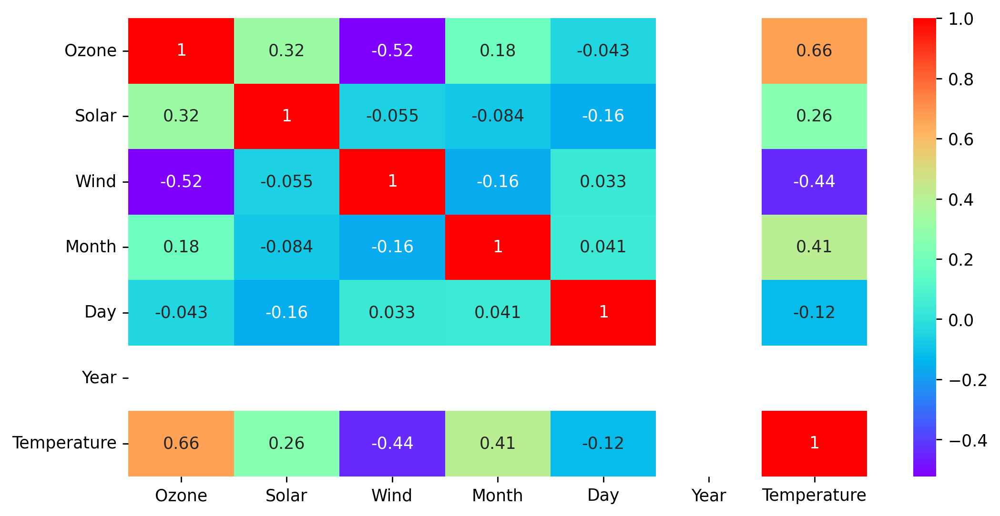

In [82]:
sns.heatmap(df.corr(), annot=True, cmap='rainbow')

In [83]:
import plotly.express as pe

In [84]:
pe.scatter(df['Ozone'], df['Wind'])

In [85]:
pe.scatter_3d(x = 'Ozone',y = 'Wind',z = 'Temperature', data_frame = df,color='Weather')

In [86]:
pe.histogram(df['Ozone'])

# Transformations

- Machines do not understand words and sentences.
- Machines only understand numbers.
- Before model building, we have convert all the categorical columns into numerical.

In [87]:
#Encoding using pandas dummy function.

In [88]:
df = pd.get_dummies(df, columns=['Weather'])

In [89]:
df

,Ozone,Solar,Wind,Month,Day,Year,Temperature,Weather_C,Weather_PS,Weather_S
1,41.0,190.0,7.4,5,1,2010,67,0,0,1
2,36.0,118.0,8.0,5,2,2010,72,1,0,0
3,12.0,149.0,12.6,5,3,2010,74,0,1,0
4,18.0,313.0,11.5,5,4,2010,62,0,0,1
5,31.0,199.0,14.3,5,5,2010,56,0,0,1
...,...,...,...,...,...,...,...,...,...,...
153,20.0,223.0,11.5,9,30,2010,68,0,0,1
154,41.0,190.0,7.4,5,1,2010,67,1,0,0
155,30.0,193.0,6.9,9,26,2010,70,0,1,0
156,31.0,145.0,13.2,9,27,2010,77,0,0,1


# **Scaling the data**

- Normalization
    - Scales value within the range of 0 to 1.
- Standardization
    - Uses Z score for scaling.
    - Scale values in such a way that the mean = 0 and standard deviation is 1.

In [90]:
from sklearn.preprocessing import StandardScaler

In [91]:
# Standard scalar is a class, to use this class we need to create an object for this class

sc = StandardScaler()

In [92]:
scaled_df  = pd.DataFrame(sc.fit_transform(df), columns=df.columns)

# fit is responsible for calculation part
# Transform is replace the original value with calculated value 

In [93]:
df.head()

,Ozone,Solar,Wind,Month,Day,Year,Temperature,Weather_C,Weather_PS,Weather_S
1,41.0,190.0,7.4,5,1,2010,67,0,0,1
2,36.0,118.0,8.0,5,2,2010,72,1,0,0
3,12.0,149.0,12.6,5,3,2010,74,0,1,0
4,18.0,313.0,11.5,5,4,2010,62,0,0,1
5,31.0,199.0,14.3,5,5,2010,56,0,0,1


In [94]:
scaled_df

,Ozone,Solar,Wind,Month,Day,Year,Temperature,Weather_C,Weather_PS,Weather_S
0,0.190194,0.046394,-0.734593,-1.412198,-1.668937,0.0,-1.146116,-0.673575,-0.653661,1.25450
1,-0.032978,-0.783413,-0.557592,-1.412198,-1.557152,0.0,-0.612802,1.484615,-0.653661,-0.79713
2,-1.104203,-0.426135,0.799418,-1.412198,-1.445367,0.0,-0.399476,-0.673575,1.529845,-0.79713
3,-0.836397,1.463982,0.474916,-1.412198,-1.333583,0.0,-1.679431,-0.673575,-0.653661,1.25450
4,-0.256150,0.150120,1.300922,-1.412198,-1.221798,0.0,-2.319408,-0.673575,-0.653661,1.25450
...,...,...,...,...,...,...,...,...,...,...
152,-0.747128,0.426722,0.474916,1.385469,1.572816,0.0,-1.039454,-0.673575,-0.653661,1.25450
153,0.190194,0.046394,-0.734593,-1.412198,-1.668937,0.0,-1.146116,1.484615,-0.653661,-0.79713
154,-0.300784,0.080969,-0.882094,1.385469,1.125678,0.0,-0.826128,-0.673575,1.529845,-0.79713
155,-0.256150,-0.472236,0.976420,1.385469,1.237462,0.0,-0.079488,-0.673575,-0.653661,1.25450


In [95]:
scaled_df.describe()

,Ozone,Solar,Wind,Month,Day,Year,Temperature,Weather_C,Weather_PS,Weather_S
count,1.570000e+02,1.570000e+02,1.570000e+02,1.570000e+02,1.570000e+02,157.0,1.570000e+02,1.570000e+02,1.570000e+02,1.570000e+02
mean,-1.640584e-16,-1.350653e-16,1.739585e-16,1.272867e-15,5.657187e-18,0.0,2.642967e-16,4.667180e-17,8.485781e-18,-7.283629e-17
std,1.003200e+00,1.003200e+00,1.003200e+00,1.003200e+00,1.003200e+00,0.0,1.003200e+00,1.003200e+00,1.003200e+00,1.003200e+00
min,-1.595181e+00,-2.062700e+00,-2.416106e+00,-1.412198e+00,-1.668937e+00,0.0,-2.319408e+00,-6.735753e-01,-6.536610e-01,-7.971303e-01
25%,-7.024938e-01,-6.796874e-01,-7.345931e-01,-7.127815e-01,-8.864446e-01,0.0,-6.128020e-01,-6.735753e-01,-6.536610e-01,-7.971303e-01
50%,-2.561501e-01,1.501200e-01,-5.608800e-02,-1.336465e-02,7.832041e-03,0.0,1.338381e-01,-6.735753e-01,-6.536610e-01,-7.971303e-01
75%,3.687310e-01,7.955257e-01,4.749160e-01,6.860522e-01,9.021087e-01,0.0,6.671525e-01,1.484615e+00,1.529845e+00,1.254500e+00
max,1.975568e+00,1.706009e+00,2.289180e+00,1.385469e+00,1.684601e+00,0.0,2.053770e+00,1.484615e+00,1.529845e+00,1.254500e+00


In [96]:
scaled_df['Ozone'].mean()

-1.6405843421212503e-16

In [97]:
scaled_df['Ozone'].std()

1.0032000081789556

In [98]:
from sklearn.preprocessing import MinMaxScaler

In [99]:
mn = MinMaxScaler()

In [100]:
minmax = pd.DataFrame(mn.fit_transform(df), columns=df.columns)


In [101]:
minmax

,Ozone,Solar,Wind,Month,Day,Year,Temperature,Weather_C,Weather_PS,Weather_S
0,0.5000,0.559633,0.357367,0.0,0.000000,0.0,0.268293,0.0,0.0,1.0
1,0.4375,0.339450,0.394984,0.0,0.033333,0.0,0.390244,1.0,0.0,0.0
2,0.1375,0.434251,0.683386,0.0,0.066667,0.0,0.439024,0.0,1.0,0.0
3,0.2125,0.935780,0.614420,0.0,0.100000,0.0,0.146341,0.0,0.0,1.0
4,0.3750,0.587156,0.789969,0.0,0.133333,0.0,0.000000,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...
152,0.2375,0.660550,0.614420,1.0,0.966667,0.0,0.292683,0.0,0.0,1.0
153,0.5000,0.559633,0.357367,0.0,0.000000,0.0,0.268293,1.0,0.0,0.0
154,0.3625,0.568807,0.326019,1.0,0.833333,0.0,0.341463,0.0,1.0,0.0
155,0.3750,0.422018,0.721003,1.0,0.866667,0.0,0.512195,0.0,0.0,1.0


In [102]:
minmax['Ozone'].max()

1.0

In [103]:
minmax['Ozone'].min()

0.0

# Speed up the EDA process

In [104]:
# !pip install pandas-profiling==3.1.0
# !pip install sweetviz

In [105]:
import pandas_profiling as pp
import sweetviz as sv

In [106]:
EDA_report= pp.ProfileReport(df, title="Pandas Profiling Report", vars={"num": {"low_categorical_threshold": 0}})
EDA_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [107]:
EDA_report.to_file(output_file='report2.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [108]:
import pandas_profiling as pp
import sweetviz as sv

In [109]:
sweet_report = sv.analyze(df)

                                             |                                             | [  0%]   00:00 ->…

In [110]:
sweet_report

In [111]:
sweet_report.show_html('weather_report.html')

Report weather_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.
